<h1 align="center">Volume 2: The Fourier Transform.</h1>

    Adam Robertson
    Math 321
    November 23, 2018

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
import numpy as np
import IPython
from scipy import fftpack
from scipy import signal
import time
import imageio

In [51]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [52]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate
        self.samples = samples

    # Problems 1.1 and 1.7
    def plot(self, frequencies=False):
        """If frequencies if false, plot the graph of the sound wave (time versus amplitude).
           If frequences is true, plot the magnitude of each frequency in the sound wave."""
        if frequencies is True:
            ax0 = plt.subplot(121)
            # Number of seconds of file is length of file divided by sample rate
            seconds = len(self.samples) / self.rate
            # Create domain of seconds with the same amount of values as the number of samples
            domain = np.linspace(0, seconds, len(self.samples))
            # Plot domain and samples
            ax0.plot(domain, self.samples)
            ax0.set_xlabel("Time (seconds)")
            ax0.set_ylabel("Samples")
            ax0.set_ylim(-32768, 32767)
            ax0.set_title("Amplitude of Sound Waves over Time")
            
            # Compute dft
            n = len(self.samples)
            # Compute dft
            dft = fftpack.fft(self.samples)  
            dft = np.abs(dft)
            # Create domain, compute frequencies
            domain = np.arange(len(dft))
            v = domain * self.rate / (n)
            # Plot frequencies of first half of the wave
            ax1 = plt.subplot(122)
            ax1.plot(v[:(len(dft)//2)], dft[:len(dft)//2])
            ax1.set_xlabel("Frequency (Hz)")
            ax1.set_ylabel("Magnitude")
            ax1.set_title("Visualization of Frequencies")
        else:
            # Number of seconds of file is length of file divided by sample rate
            seconds = len(self.samples) / self.rate
            # Create domain of seconds with the same amount of values as the number of samples
            domain = np.linspace(0, seconds, len(self.samples))
            # Plot domain and samples
            plt.plot(domain, self.samples)
            plt.ylim(-32768, 32767)
            plt.xlabel("Time (seconds)")
            plt.ylabel("Samples")
            plt.title("Amplitude of Sound Waves over Time")
        
        plt.show()

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        self.samples = np.real(self.samples)
        # Check whether samples should be scaled
        if force == True or self.samples.dtype != 'int16':
            # Scale samples
            scaled_samples = np.int16((self.samples * 32767.) / max(abs(self.samples)))
            # Write new file, export samples
            wavfile.write(filename, self.rate, scaled_samples)
        else:
            # If samples were not scaled, export samples
            wavfile.write(filename, self.rate, np.real(self.samples))
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        # Verify that the samples are the same length
        if len(self.samples) != len(other.samples):
            raise ValueError("Samples are not the same length")
        # Add the two samples element-wise
        s = self.samples + other.samples
        # Instantiate and return a new SoundWave object with the added sounds
        return SoundWave(self.rate, s)

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        # Verify that the samples rates are the same
        if self.rate != other.rate:
            raise ValueError("Sample rates are not the same size")
        # Concatenate the two sound samples from this and other object
        s = np.concatenate((self.samples, other.samples))
        # Instantiate and return a new SoundWave object with the concatenated sounds
        return SoundWave(self.rate, s)
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        # Check that the samples have the same rate
        if self.rate != other.rate:
            raise ValueError("Samples do not have the same rate.")
        # Make sure that both samples have the same length
        # Append zeros to the shorter sample until they have the same length
        if len(self.samples) < len(other.samples):
            # If self is shorter, append zeros to self until it has the same length as other
            self.samples = np.hstack((self.samples, np.zeros(len(other.samples) - len(self.samples))))
        else:
            # If other is shorter, append zeros to other until it has the same length as self
            other.samples = np.hstack((other.samples, np.zeros(len(self.samples) - len(other.samples))))        
        # Compute ffts of self and others
        fft_f = fftpack.fft(self.samples)
        fft_g = fftpack.fft(other.samples)
        # Compute hadamard transformation
        hadamard = np.multiply(fft_f, fft_g)
        # Compute and return inverse fft
        return SoundWave(self.rate, fftpack.ifft(hadamard))
        
        
    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        # Check that the samples have the same rate
        if self.rate != other.rate:
            raise ValueError("Samples do not have the same rate.")
        # Size is n + m - 1
        size = len(self.samples) + len(other.samples) - 1
        # Compute a, the greatest power of 2 bigger than size
        a = int((np.log(float(size)) / np.log(2.0)) + 1)
        # Append zeros to samples of self and other
        # Self becomes f
        # Other becomes g
        f = np.hstack((self.samples, np.zeros(2**a - len(self.samples))))
        g = np.hstack((other.samples, np.zeros(2**a - len(other.samples))))
        # Generate new sound waves to be convoluted
        f_h = SoundWave(self.rate, f)
        g_h = SoundWave(self.rate, g)
        # Compute convolution of f_h and g_h
        convolution = f_h * g_h
        # Return new sound wave with the first n + m - 1 entries of the array of convoluted samples
        return SoundWave(self.rate, convolution.samples[:size])
        
    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        # Take DFT of samples
        fft_f = fftpack.fft(self.samples)
        # Get indices of frequencies to remove
        n = len(self.samples)
        # Get indices on left half of array
        k_low = low_freq * n // self.rate
        k_high = high_freq * n // self.rate
        # Get indices on right half of array
        k_upper_low = n - k_high
        k_upper_high = n - k_low
        # Set frequencies in desired range to zeros
        fft_f[k_low:k_high+1] = 0
        fft_f[k_upper_low:k_upper_high+1] = 0
        # Take IDFT and return new SoundWave with samples
        idft = fftpack.ifft(fft_f)
        return SoundWave(self.rate, idft)

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavefile.read()` and the `SoundWave` class to plot `tada.wav`.

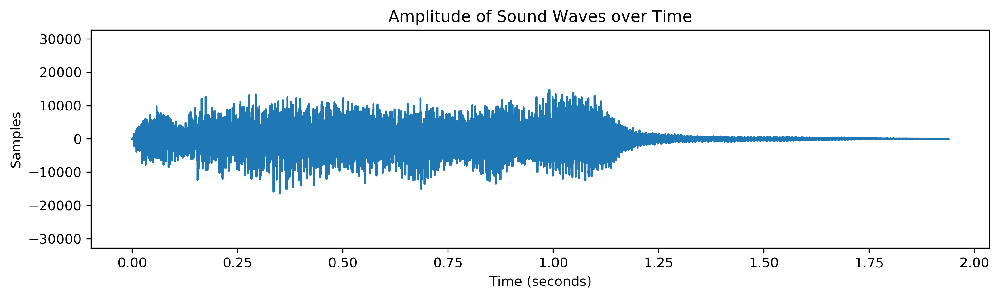

In [53]:
# Plot tada.wav
rate, samples = wavfile.read("tada.wav")
sound_wave = SoundWave(rate, samples)
sound_wave.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [54]:
# Instantiate SoundWave object
rate, samples = wavfile.read("tada.wav")
sound_wave = SoundWave(rate, samples)

In [55]:
# Play original sound file
print("Original File")
IPython.display.Audio(filename="tada.wav")

Original File


In [56]:
# Copy original file to create identical wav file
sound_wave.export("copy.wav")
# Play copy of original sound file
print("Copy of Original File")
IPython.display.Audio(filename="copy.wav")

Copy of Original File


In [57]:
# Create a scaled version of original file
# This file will have a higher volume than the original
sound_wave.export("scaled_copy.wav", force=True)
print("Scaled Version of Original File")
IPython.display.Audio(filename="scaled_copy.wav")

Scaled Version of Original File


### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [58]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    # Sample rate is always 44100
    rate = 44100
    # Create domain for sound by taking rate * duration even values
    # in interval [0, duration]
    domain = np.linspace(0, duration, rate * duration)
    # Compute samples from domain
    # A pure frequency is given by f(x) = sin(2 * pi * x * k)
    samples = np.array([np.sin(2 * np.pi * frequency * i) for i in domain])
    # Create sound wave object
    sound = SoundWave(rate, samples)
    return sound

In [59]:
# Create an A tone lasting for 2 seconds
A = generate_note(440, 2)
# Embed A tone in notebook
A.export("a.wav")
IPython.display.Audio(filename="a.wav")

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [60]:
# Generate notes A, C, and E with corresponding frequencies
A = generate_note(440, 3)
C = generate_note(523.25, 3)
E = generate_note(659.25, 3)
# Add A, C and E
AC = A + C
ACE = AC + E
# Embed ACE Chord in notebook
ACE.export("ace_chord.wav")
IPython.display.Audio(filename="ace_chord.wav")

In [61]:
# Use notes A, C, and E from above
# Concatenate the three notes to form accio A -> C -> E
aggio = A >> C >> E
#Embed aggion in notebook
aggio.export("aggio.wav")
IPython.display.Audio(filename="aggio.wav")

### Problem 1.5

- Implement `simple_dft()` with the formula for $c_k$ given below.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

$$
c_k = \frac{1}{n}\sum_{\ell=0}^{n-1} f_\ell e^{-2 \pi i k \ell\, /\, n}
$$

In [62]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    # Set n as number of samples
    n = len(samples)
    # Construct array of values that correspond to the exponential part of the formula
    # Each element of matrix is exp(-2 * pi * 1j * k * l)
    F = np.array([np.array([np.exp(-2 * np.pi * 1j * k * l / n) for l in range(n)]) for k in range(n)]) / n
    # The sum is constructed by matrix multiplication
    return F @ samples.T

In [63]:
# Check that simple_dft() and scipy.fftpack.fft() give the same result
f = np.random.randint(2, 100, 5)
print("dft and scipy.fft are the same: " + str(np.allclose(len(f) * simple_dft(f), fftpack.fft(f))))

dft and scipy.fft are the same: True


### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [64]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    # Recursive inner function
    def split(g):
        # Get size of g
        n = len(g)
        if n <= threshold:
            # Use the function from problem 5 for small enough g
            return n * simple_dft(g)
        else:
            # Get the DFT of every other entry of g, starting from 0
            even = split(g[::2])
            # Get the DFT of every other entry of g, starting from 1
            odd = split(g[1::2])
            z = np.array([np.exp(-2 * np.pi * 1j * k / n) for k in range(n)])
            # Get the middle index for z (using integer division)
            m = n // 2
            # Concatenate two arrays of length m
            return np.hstack((even + np.multiply(z[:m], odd), even + np.multiply(z[m:], odd)))
   
    return split(samples) / len(samples)

In [65]:
f = np.random.randint(2, 100, 1024)

# Compare runtimes for standard dft algorithm, fft, algorithm, and scipy fft algorithm
print("Runtime for simple dft")
%time dft = simple_dft(f)
print("Runtime for fft")
%time fft = simple_fft(f)
print("Runtime for scipy.fftpack.fft")
%time scipy_fft = fftpack.fft(f)
print("simple_fft and scipy are the same: " + str(np.allclose(len(f) * fft, scipy_fft)))

Runtime for simple dft
Wall time: 5.08 s
Runtime for fft
Wall time: 109 ms
Runtime for scipy.fftpack.fft
Wall time: 0 ns
simple_fft and scipy are the same: True


### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

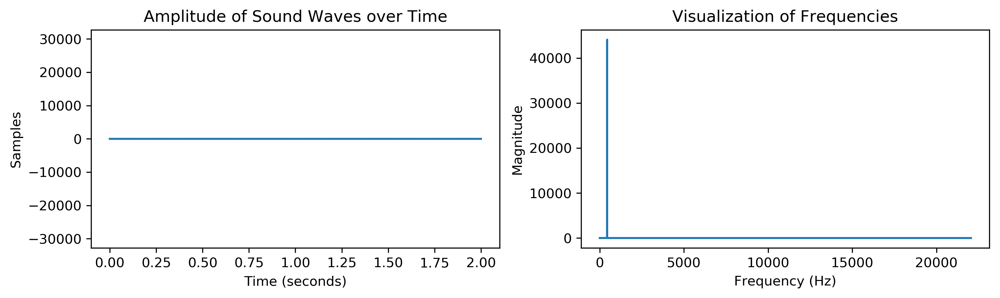

In [66]:
# Generate A tone
a = generate_note(440, 2)
# Plot A tone
a.plot(frequencies=True)

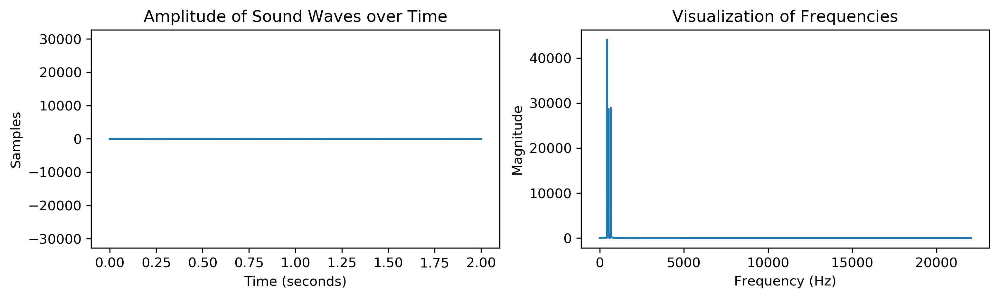

In [67]:
# Generate A, C, E
A = generate_note(440, 2)
C = generate_note(523.25, 2)
E = generate_note(659.25, 2)
# Add A, C and E
ACE = A + C + E
# Plot A minor chord
ACE.plot(frequencies=True)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

In [68]:
rate, samples = wavfile.read("mystery_chord.wav")

# Compute and truncate dft
dft = fftpack.fft(samples)
dft = np.abs(dft)
dft = dft[:(len(dft)//2)]

# Get frequencies
v = np.arange(len(dft))
v = v * rate / len(samples)

# Sort dft to get highest frequencies
sort = np.argsort(dft)[::-1]

# After consulting graph, I saw that there are 4 frequencies
# Print the four frequencies
for i in range(4):
    print(v[sort[i]])

440.0
784.0
523.25
587.5


The notes are: A, G, C, D

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [69]:
# Read in tada.wav
rate, samples = wavfile.read("tada.wav")
sound_wave = SoundWave(rate, samples)
# Generate white noise samples
white = np.random.randint(-32767, 32767, rate*2, dtype=np.int16)
# Create white noise sound wave
white_noise = SoundWave(rate, white)
# Convolution of sound_wave and white_noise
convolution = sound_wave * white_noise  
# Play convolution
convolution.export("convolution.wav")
IPython.display.Audio(filename="convolution.wav")

In [70]:
# Right shift convolution
shifted_convolution = convolution >> convolution
# Play right shifted convolution
shifted_convolution.export("shifted_convolution.wav")
IPython.display.Audio(filename="shifted_convolution.wav")

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [71]:
# Read in and play CGC.wav
rate, samples = wavfile.read("CGC.wav")
cgc = SoundWave(rate, samples)
IPython.display.Audio(filename="CGC.wav")

In [72]:
# Read in and play GCG.wav
rate, samples = wavfile.read("GCG.wav")
gcg = SoundWave(rate, samples)
IPython.display.Audio(filename="GCG.wav")

In [73]:
# Time linear convolution of cgc and gcg
print("Time for linear convolution")
%time lin_convolution = cgc ** gcg
# Export and play convolution
lin_convolution.export("lin_convolution.wav")
IPython.display.Audio(filename="lin_convolution.wav")

Time for linear convolution
Wall time: 363 ms


In [74]:
# Time linear convolution using scipy.signal.fftconvolve
print("Time for scipy.signal.fftconvolve")
%time samples =  signal.fftconvolve(cgc.samples, gcg.samples)
scipy_convolve = SoundWave(rate, samples)
# Export and play convolution
scipy_convolve.export("scipy_convolve.wav")
IPython.display.Audio(filename="scipy_convolve.wav")

Time for scipy.signal.fftconvolve
Wall time: 101 ms


### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [75]:
# Read in and play chopin.wav
rate, samples = wavfile.read("chopin.wav")
chopin = SoundWave(rate, samples)
IPython.display.Audio(filename="chopin.wav")

In [76]:
# Read in and play balloon.wav
rate, samples = wavfile.read("balloon.wav")
balloon = SoundWave(rate, samples)
IPython.display.Audio(filename="balloon.wav")

In [77]:
# Convolve chopin and balloon
lin_convolution = chopin ** balloon
# Export and play chopin with echo
lin_convolution.export("echo_chopin.wav")
IPython.display.Audio(filename="echo_chopin.wav")

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [78]:
# Read in and play noisy1.wav
rate, samples = wavfile.read("noisy1.wav")
noisy1 = SoundWave(rate, samples)
IPython.display.Audio(filename="noisy1.wav")

In [79]:
# Clean noisy1.wav
noisy1_clean = noisy1.clean(1250, 2600)
# Play new, cleaned version
noisy1_clean.export("noisy1_clean.wav")
IPython.display.Audio(filename="noisy1_clean.wav")

In [80]:
# Read in and play noisy1.wav
rate, samples = wavfile.read("noisy2.wav")
noisy2 = SoundWave(rate, samples)
IPython.display.Audio(filename="noisy2.wav")

In [81]:
# Clean noisy2.wav
# After plotting, and testing a few different boundaries,
# I found that i needed to remove frequencies in the interval 
# from 1300 Hz to 4500 Hz
noisy2_clean = noisy2.clean(1300,4500)
# Play new, cleaned version
noisy2_clean.export("noisy2_clean.wav")
# FDR's Inaugural Address: The only thing we have to fear is fear itself.
IPython.display.Audio(filename="noisy2_clean.wav")

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [82]:
# Read in data from vuvuzela.wav
rate, samples = wavfile.read("vuvuzela.wav")
# Separate sound into two columns
col1 = samples[:,0]
col2 = samples[:,1]
# Play original audio file
IPython.display.Audio(filename="vuvuzela.wav")

In [83]:
# Clean each sound wave separately
clean_1 = SoundWave(rate, col1).clean(200,500)
clean_2 = SoundWave(rate, col2).clean(200,500)
# Recombinie sound waves
clean = clean_1 + clean_2
# Play new, cleaned version
clean.export("vuvuzela_clean.wav")
IPython.display.Audio(filename="vuvuzela_clean.wav")

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

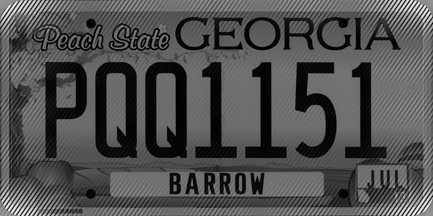

In [84]:
# Display original image
IPython.display.Image(filename="license_plate.png")

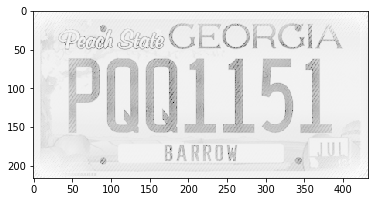

In [17]:
# Read in image
im = imageio.imread("license_plate.png")
# Compute DFT
im_dft = fftpack.fft2(im)
# Compute mean of image
mean = np.mean(im_dft)
# Set brightest patches of DFT to mean
im_dft[32:40,100:105]=mean
im_dft[178:185,330:335]=mean
#plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
# Compute IDFT
im_dft_ifft = fftpack.ifft2(im_dft).real
# Plot and show cleaned image
plt.imshow(np.log(np.abs(im_dft_ifft)), cmap="gray")
plt.show()

The year on the sticker is 13 (for 2013)